# Image inpainting over CIFAR-10

The purpose of this project is to build and train a neural network for image inpainting over the CIFAR-10 dataset. 

Inpainting is a restauration process where damaged, deteriorated, or missing parts of an artwork are filled in to present a complete image.

In our case, we create the portion of the image to be filled in by cropping a fixed size rectangular area from CIFAR-10 images.

The networks must be trained over the training set, and tested on the test set.
You can split the train set into a validation set, if you wish.

The metrics that will be used to evaluate you result is Mean Square Error.

In [13]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

#if on colab install this
if 'google.colab' in str(get_ipython()):
    !pip install git+https://github.com/tensorflow/docs
else:
    device_name = tf.test.gpu_device_name()
    if device_name != '/device:GPU:0':
        print('GPU device not found')
    else:
        print('Found GPU at: {}'.format(device_name))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-nigr6src
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-nigr6src
  Resolved https://github.com/tensorflow/docs to commit 0c2cf1d56fbd9ce171f96a5121554126a0fef903
  Preparing metadata (setup.py) ... done


In [14]:
from tensorflow.keras import layers, models, metrics
from tensorflow.keras.datasets import cifar10

Here we load the dataset.

In [15]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
print("image range is {}, {}".format(np.min(x_test,axis=(0,1,2,3)),np.max(x_test,axis=(0,1,2,3))))
x_train = (x_train/255.).astype(np.float32)
x_test = (x_test/255.).astype(np.float32)
print("new image range is {}, {}".format(np.min(x_test,axis=(0,1,2,3)),np.max(x_test,axis=(0,1,2,3))))

image range is 0, 255
new image range is 0.0, 1.0


Let's see some examples.

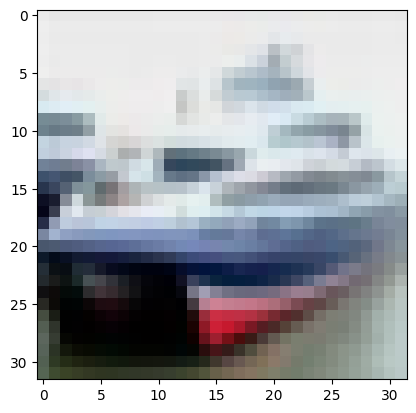

In [16]:
plt.imshow(x_test[1])
plt.show()

Now we hide a portion of the input, and the purpose of the network is to reconstruct it.

In [17]:
def mask(X,coords):
  x0,y0,x1,y1 = coords
  X[:,x0:x1,y0:y1] = 0
  return X

masked_x_train = mask(np.copy(x_train),(2,16,30,30))
masked_x_test = mask(np.copy(x_test),(2,16,30,30))

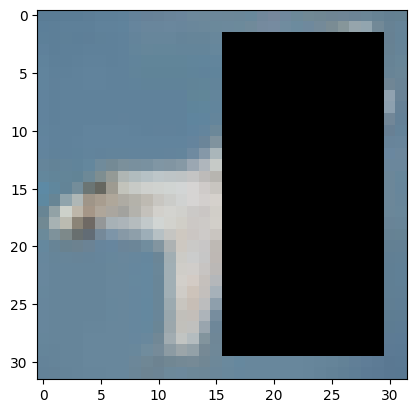

In [18]:
plt.imshow(masked_x_test[10])
plt.show()

# Approaches and evaluation

The network is supposed to take in input the masked image and fill in the missing part. 

You may basically follow two main approaches:
*   either you return the full image
*   you just return the missing crop

In the first case, the mse is to be evaluated on the full image; in the second case just on the crop (since on the reamining part is 0). 

If you want to take a different approach, you can ask for my approuval.



# What to deliver

As usual, you are supposed to deliver a single notebook comprising the code, the training history, and the evaluation on test data in terms of Mean Square Error.

Good work!

# Model
We use Generative Adversarial Networks (GANs) to perform image inpainting on CIFAR10. GANs are composed of two neural networks: a generator and a discriminator. The generator tries to create realistic images that match the input image except for the masked parts, while the discriminator tries to distinguish between real and fake images. The generator and the discriminator compete with each other and improve each other’s performance.

We use GANs for image inpainting because they can generate realistic and diverse results that preserve both global and local features of the image. They can also handle irregular and large masks that may be difficult for other methods. GANs are also flexible and can be adapted to different datasets and tasks.

We implement GANs on Keras, a high-level deep learning framework. We use an encoder-decoder architecture for the generator and a convolutional network for the discriminator. We train the GAN model with binary crossentropy loss and Adam optimizer. We use callbacks to save the generated images after each epoch and to stop training when there are no more improvements.

We evaluate the GAN model by visually inspecting the generated images and comparing them with the original images. We also use quantitative metrics such as peak signal-to-noise ratio (PSNR) and structural similarity index (SSIM) to measure the quality of the inpainted images.

In [19]:
# Import Keras modules
from tensorflow.keras import Model
from tensorflow.keras import optimizers
from tensorflow.keras import Sequential


In [20]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, LeakyReLU, Dropout, Flatten, Dense, Concatenate
from tensorflow import keras as ks

## Generator
It's a UNET, whose last layer is a Lambda layer which allows to generate only the masked region, leaving the rest unchanged

In [41]:
def make_generator_model(input_shape, n_ch=32, L=4, conv_per_L=2, lam=True): 
    #L=num of floors,
    #conv_per_L = num of conv layers in each floor

    #INPUT
    x=Input(shape=input_shape) #first input layer
    h=x

    #DOWN
    backup_layers=[]
    for l in range(L):
        for c in range(conv_per_L):
            h = Conv2D(n_ch, 3, 1, padding="same")(h) #conv
            h = BatchNormalization()(h) #batch norm
            h = LeakyReLU(alpha=0.1)(h) #leaky relu
        if l<L-1:
            backup_layers.append(h) #save layer for the SKIPS (BEFORE DOWNSAMPLING!!!)
            h= MaxPooling2D(padding="same")(h)
            n_ch=n_ch*2 #double channels


    #UP
    for l in range(L-1):
        n_ch=n_ch//2 #divide channels
        h=UpSampling2D()(h)#upsample
        h = ks.layers.concatenate([h, backup_layers.pop(-1)])

        for c in range(conv_per_L):
            h = Conv2D(n_ch, 3, 1, padding="same")(h) #conv
            h = BatchNormalization()(h) #batch norm
            h = LeakyReLU(alpha=0.1)(h) #leaky relu
            h = Dropout(0.2)(h) #dropout

    #OUTPUT
    y=Conv2D(3,1, activation="sigmoid")(h) #last layer is still Conv2D (FULLY CONVOLUTIONAL!). Activation is SIGMOID since it's a BINARY CLASSIFICATION
    if lam:
      replacement_layer = layers.Lambda(lambda x: tf.where(tf.equal(x[0], 0), x[1], x[0]))([x, y])
      return Model(x,replacement_layer)
    else:
      return Model(x, y)
  

In [42]:
generator = make_generator_model(x_train[0].shape, L=2, conv_per_L=3)
generator.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_24 (Conv2D)             (None, 32, 32, 32)   896         ['input_3[0][0]']                
                                                                                                  
 batch_normalization_18 (BatchN  (None, 32, 32, 32)  128         ['conv2d_24[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 leaky_re_lu_22 (LeakyReLU)     (None, 32, 32, 32)   0           ['batch_normalization_18[0]

## Discriminator
The discriminator has to decide wheter y is real or fake

In [43]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    model.add(layers.Activation("sigmoid"))
    return model

In [44]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_34 (Conv2D)          (None, 16, 16, 64)        4864      
                                                                 
 leaky_re_lu_31 (LeakyReLU)  (None, 16, 16, 64)        0         
                                                                 
 dropout_13 (Dropout)        (None, 16, 16, 64)        0         
                                                                 
 conv2d_35 (Conv2D)          (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_32 (LeakyReLU)  (None, 8, 8, 128)         0         
                                                                 
 dropout_14 (Dropout)        (None, 8, 8, 128)         0         
                                                                 
 flatten_2 (Flatten)         (None, 8192)             

## Add together
Create a custom GAN model class. <br>
**Using this [guide](https://medium.com/dive-into-ml-ai/customization-of-model-fit-to-write-a-combined-discriminator-generator-gan-trainer-in-keras-524bce10cf66) as reference**

# GAN

## Train

In [26]:
EPOCHS = 50
num_examples_to_generate = 16
BUFFER_SIZE = 60000
BATCH_SIZE = 128


The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

In [51]:
from tensorflow import keras 

class GAN(keras.Model):
    def __init__(self, discriminator, generator):
        super(GAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator

    def compile(self, d_optimizer, g_optimizer, loss_fn, loss_g, loss_weights):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.loss_g=loss_g
        self.loss_weights=loss_weights

    def train_step(self, data):
        masked_images, real_images = data
        if isinstance(real_images, tuple):
            real_images = real_images[0]
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]

        # Decode them to fake images
        generated_images = self.generator(masked_images)
        # Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # Assemble labels discriminating real from fake images
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0
        )
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Assemble labels that say "all real images"
        misleading_labels = tf.zeros((batch_size, 1))

        # Train the generator, using discriminator's output
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(masked_images))
            adv_g_loss = self.loss_weights[0]* self.loss_fn(misleading_labels, predictions)
            gen_g_loss = self.loss_weights[1]* self.loss_g(generated_images, real_images)
        grads = tape.gradient([adv_g_loss, gen_g_loss], self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))
        return {"d_loss": d_loss, "adv_g_loss": adv_g_loss, "gen_g_loss": gen_g_loss}


In [48]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

def generate_and_save_images(model, epoch):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(masked_x_test[:num_examples_to_generate], training=False)

  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, :]) 
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch+50))
  #if epoch % 5 == 4:
  plt.show()
  #else:
  #  plt.close()
  
class gifCallback(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
      generate_and_save_images(generator, epoch)

In [55]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

generator = make_generator_model(x_train[0].shape, L=2, conv_per_L=3)
discriminator=make_discriminator_model()
gan=GAN(discriminator, generator)

gan.compile(discriminator_optimizer, generator_optimizer,loss_fn=keras.losses.BinaryCrossentropy(from_logits=False), loss_g=keras.losses.MeanSquaredError(), loss_weights=[0.2,0.8])

In [ ]:
gan.built=True
gan.load_weights("gan_inpainting.h5")

Epoch 1/50
(None, 32, 32, 3)
(None, 32, 32, 3)
390/391 [============================>.] - ETA: 0s - d_loss: 0.5780 - adv_g_loss: 0.2351 - gen_g_loss: 0.0382

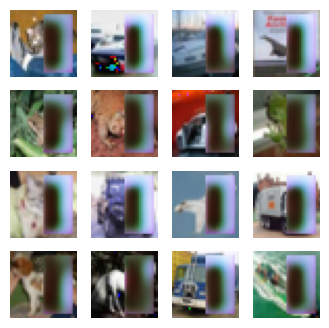

391/391 [==============================] - 38s 71ms/step - d_loss: 0.5786 - adv_g_loss: 0.2352 - gen_g_loss: 0.0382
Epoch 2/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6547 - adv_g_loss: 0.1802 - gen_g_loss: 0.0206

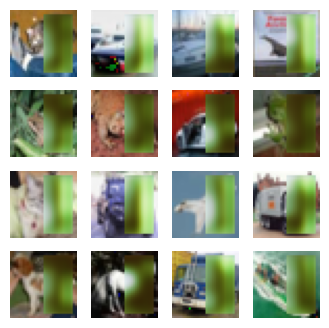

391/391 [==============================] - 28s 71ms/step - d_loss: 0.6552 - adv_g_loss: 0.1800 - gen_g_loss: 0.0205
Epoch 3/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6073 - adv_g_loss: 0.1949 - gen_g_loss: 0.0197

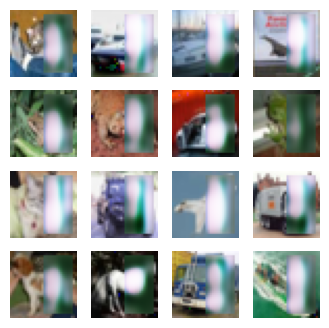

391/391 [==============================] - 29s 73ms/step - d_loss: 0.6073 - adv_g_loss: 0.1949 - gen_g_loss: 0.0197
Epoch 4/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6359 - adv_g_loss: 0.1966 - gen_g_loss: 0.0210

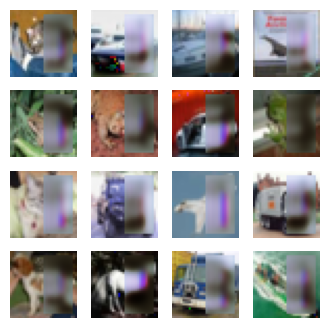

391/391 [==============================] - 29s 74ms/step - d_loss: 0.6360 - adv_g_loss: 0.1966 - gen_g_loss: 0.0209
Epoch 5/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6183 - adv_g_loss: 0.1918 - gen_g_loss: 0.0173

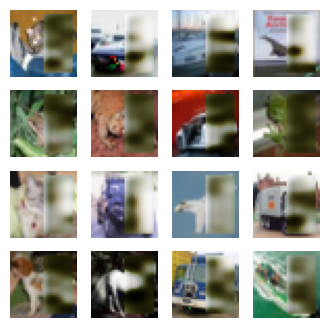

391/391 [==============================] - 29s 74ms/step - d_loss: 0.6186 - adv_g_loss: 0.1916 - gen_g_loss: 0.0173
Epoch 6/50
391/391 [==============================] - ETA: 0s - d_loss: 0.5660 - adv_g_loss: 0.2238 - gen_g_loss: 0.0205

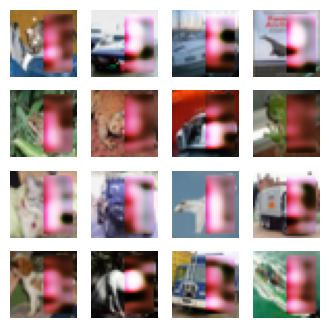

391/391 [==============================] - 29s 74ms/step - d_loss: 0.5662 - adv_g_loss: 0.2237 - gen_g_loss: 0.0205
Epoch 7/50
391/391 [==============================] - ETA: 0s - d_loss: 0.5453 - adv_g_loss: 0.2350 - gen_g_loss: 0.0184

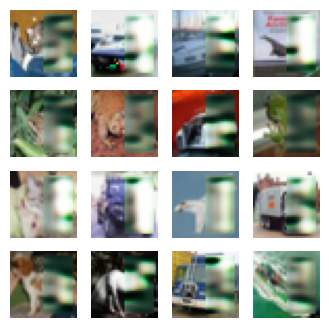

391/391 [==============================] - 29s 74ms/step - d_loss: 0.5448 - adv_g_loss: 0.2352 - gen_g_loss: 0.0184
Epoch 8/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.4567 - adv_g_loss: 0.3208 - gen_g_loss: 0.0219

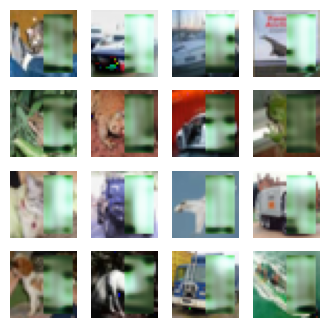

391/391 [==============================] - 29s 75ms/step - d_loss: 0.4579 - adv_g_loss: 0.3202 - gen_g_loss: 0.0219
Epoch 9/50
391/391 [==============================] - ETA: 0s - d_loss: 0.4485 - adv_g_loss: 0.3256 - gen_g_loss: 0.0160

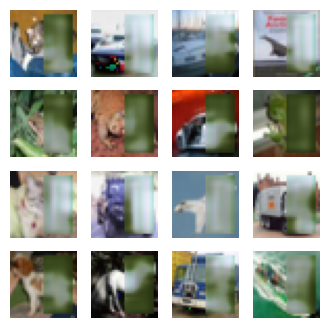

391/391 [==============================] - 30s 76ms/step - d_loss: 0.4483 - adv_g_loss: 0.3256 - gen_g_loss: 0.0160
Epoch 10/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.4326 - adv_g_loss: 0.3616 - gen_g_loss: 0.0199

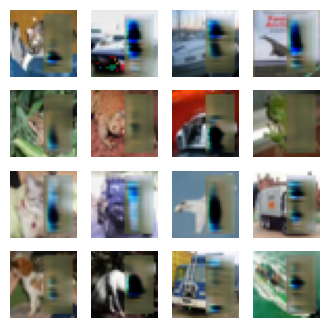

391/391 [==============================] - 29s 75ms/step - d_loss: 0.4319 - adv_g_loss: 0.3623 - gen_g_loss: 0.0199
Epoch 11/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.5585 - adv_g_loss: 0.2517 - gen_g_loss: 0.0145

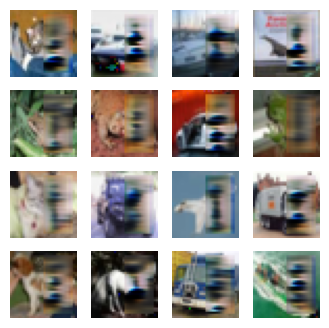

391/391 [==============================] - 29s 75ms/step - d_loss: 0.5591 - adv_g_loss: 0.2516 - gen_g_loss: 0.0145
Epoch 12/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6200 - adv_g_loss: 0.2237 - gen_g_loss: 0.0165

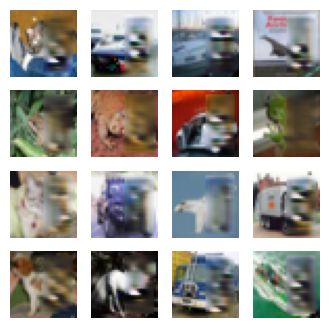

391/391 [==============================] - 29s 75ms/step - d_loss: 0.6202 - adv_g_loss: 0.2234 - gen_g_loss: 0.0165
Epoch 13/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6710 - adv_g_loss: 0.1860 - gen_g_loss: 0.0160

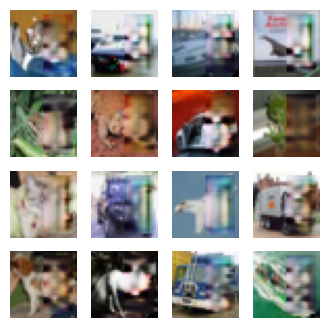

391/391 [==============================] - 29s 75ms/step - d_loss: 0.6710 - adv_g_loss: 0.1860 - gen_g_loss: 0.0160
Epoch 14/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6114 - adv_g_loss: 0.2023 - gen_g_loss: 0.0138

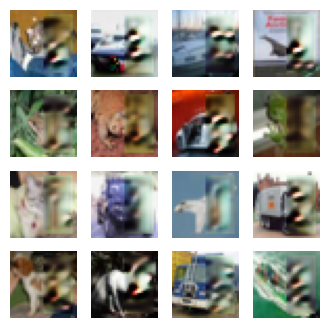

391/391 [==============================] - 30s 77ms/step - d_loss: 0.6117 - adv_g_loss: 0.2022 - gen_g_loss: 0.0138
Epoch 15/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.5924 - adv_g_loss: 0.2283 - gen_g_loss: 0.0145

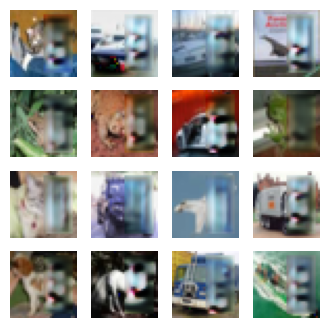

391/391 [==============================] - 29s 75ms/step - d_loss: 0.5937 - adv_g_loss: 0.2279 - gen_g_loss: 0.0145
Epoch 16/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6123 - adv_g_loss: 0.2246 - gen_g_loss: 0.0144

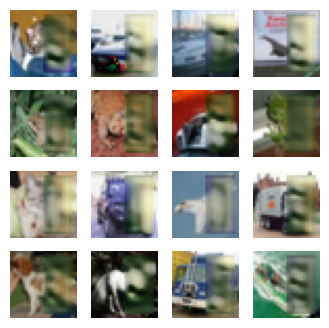

391/391 [==============================] - 29s 75ms/step - d_loss: 0.6139 - adv_g_loss: 0.2242 - gen_g_loss: 0.0144
Epoch 17/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.5603 - adv_g_loss: 0.2352 - gen_g_loss: 0.0138

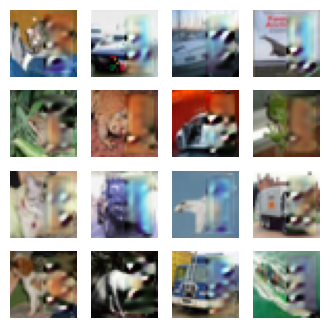

391/391 [==============================] - 29s 75ms/step - d_loss: 0.5607 - adv_g_loss: 0.2351 - gen_g_loss: 0.0138
Epoch 18/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.5627 - adv_g_loss: 0.2528 - gen_g_loss: 0.0151

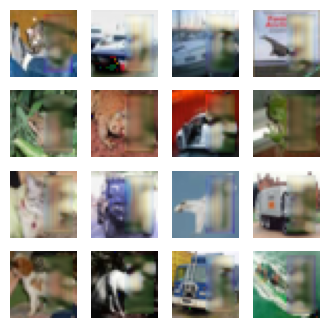

391/391 [==============================] - 29s 75ms/step - d_loss: 0.5627 - adv_g_loss: 0.2526 - gen_g_loss: 0.0151
Epoch 19/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.5458 - adv_g_loss: 0.2415 - gen_g_loss: 0.0129

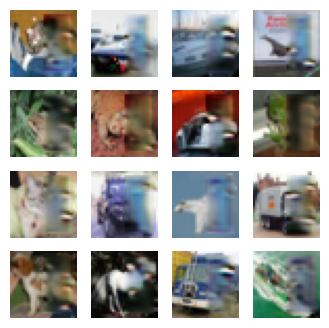

391/391 [==============================] - 30s 76ms/step - d_loss: 0.5458 - adv_g_loss: 0.2415 - gen_g_loss: 0.0129
Epoch 20/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.5399 - adv_g_loss: 0.2812 - gen_g_loss: 0.0151

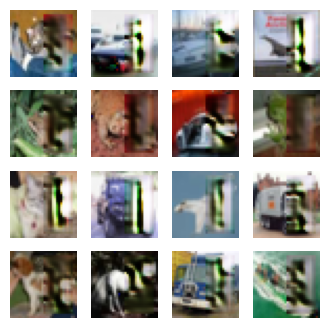

391/391 [==============================] - 29s 75ms/step - d_loss: 0.5407 - adv_g_loss: 0.2813 - gen_g_loss: 0.0151
Epoch 21/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.5657 - adv_g_loss: 0.2409 - gen_g_loss: 0.0141

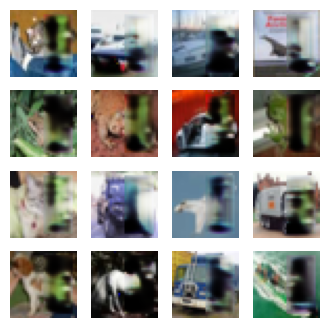

391/391 [==============================] - 29s 75ms/step - d_loss: 0.5653 - adv_g_loss: 0.2410 - gen_g_loss: 0.0141
Epoch 22/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6271 - adv_g_loss: 0.2462 - gen_g_loss: 0.0157

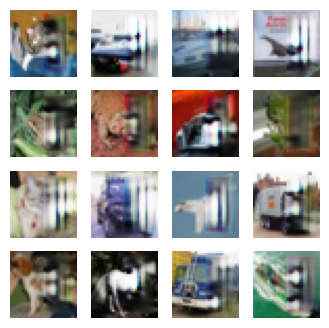

391/391 [==============================] - 29s 75ms/step - d_loss: 0.6269 - adv_g_loss: 0.2462 - gen_g_loss: 0.0157
Epoch 23/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6068 - adv_g_loss: 0.2233 - gen_g_loss: 0.0145

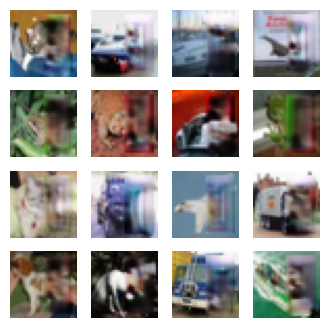

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6068 - adv_g_loss: 0.2233 - gen_g_loss: 0.0145
Epoch 24/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6312 - adv_g_loss: 0.2230 - gen_g_loss: 0.0155

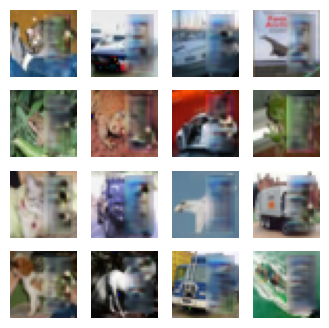

391/391 [==============================] - 29s 75ms/step - d_loss: 0.6318 - adv_g_loss: 0.2228 - gen_g_loss: 0.0155
Epoch 25/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6315 - adv_g_loss: 0.2152 - gen_g_loss: 0.0152

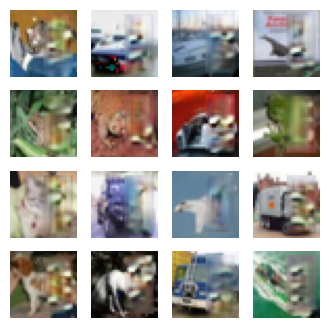

391/391 [==============================] - 29s 74ms/step - d_loss: 0.6320 - adv_g_loss: 0.2150 - gen_g_loss: 0.0152
Epoch 26/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6778 - adv_g_loss: 0.1874 - gen_g_loss: 0.0141

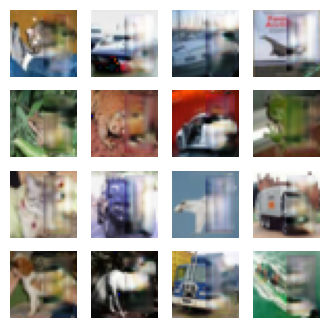

391/391 [==============================] - 29s 75ms/step - d_loss: 0.6786 - adv_g_loss: 0.1872 - gen_g_loss: 0.0141
Epoch 27/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6522 - adv_g_loss: 0.1945 - gen_g_loss: 0.0145

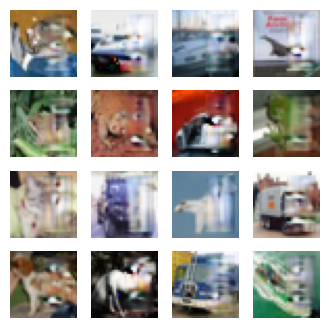

391/391 [==============================] - 29s 75ms/step - d_loss: 0.6523 - adv_g_loss: 0.1945 - gen_g_loss: 0.0145
Epoch 28/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6512 - adv_g_loss: 0.1948 - gen_g_loss: 0.0141

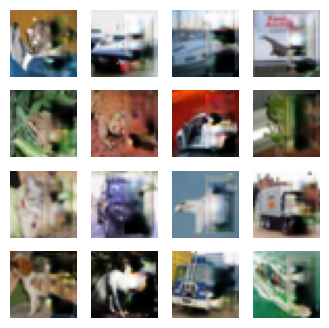

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6509 - adv_g_loss: 0.1949 - gen_g_loss: 0.0141
Epoch 29/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6581 - adv_g_loss: 0.1969 - gen_g_loss: 0.0140

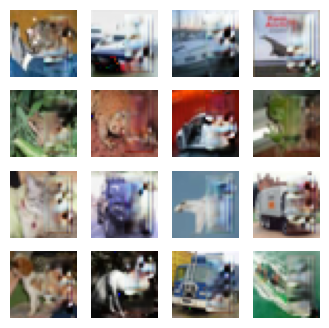

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6585 - adv_g_loss: 0.1968 - gen_g_loss: 0.0140
Epoch 30/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6768 - adv_g_loss: 0.1863 - gen_g_loss: 0.0146

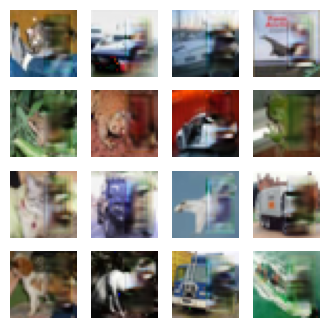

391/391 [==============================] - 29s 75ms/step - d_loss: 0.6764 - adv_g_loss: 0.1863 - gen_g_loss: 0.0147
Epoch 31/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6746 - adv_g_loss: 0.1882 - gen_g_loss: 0.0154

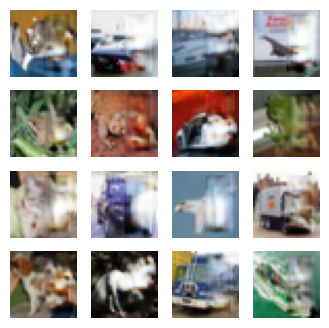

391/391 [==============================] - 29s 75ms/step - d_loss: 0.6743 - adv_g_loss: 0.1883 - gen_g_loss: 0.0154
Epoch 32/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6699 - adv_g_loss: 0.1822 - gen_g_loss: 0.0143

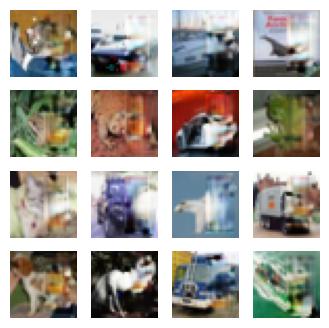

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6699 - adv_g_loss: 0.1822 - gen_g_loss: 0.0143
Epoch 33/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6849 - adv_g_loss: 0.1817 - gen_g_loss: 0.0148

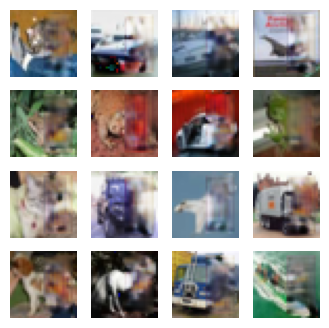

391/391 [==============================] - 30s 77ms/step - d_loss: 0.6850 - adv_g_loss: 0.1818 - gen_g_loss: 0.0148
Epoch 34/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6720 - adv_g_loss: 0.1802 - gen_g_loss: 0.0138

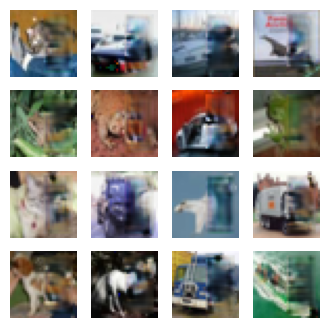

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6720 - adv_g_loss: 0.1802 - gen_g_loss: 0.0138
Epoch 35/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6677 - adv_g_loss: 0.1790 - gen_g_loss: 0.0142

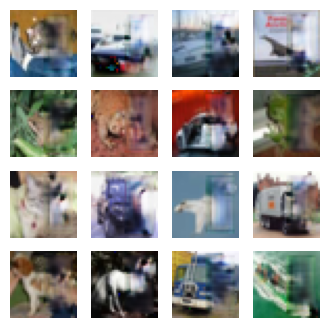

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6680 - adv_g_loss: 0.1789 - gen_g_loss: 0.0141
Epoch 36/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6787 - adv_g_loss: 0.1803 - gen_g_loss: 0.0149

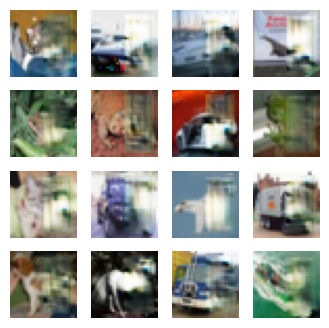

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6785 - adv_g_loss: 0.1804 - gen_g_loss: 0.0149
Epoch 37/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6782 - adv_g_loss: 0.1731 - gen_g_loss: 0.0136

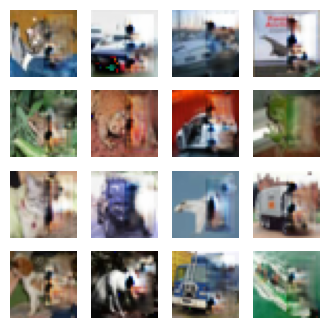

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6783 - adv_g_loss: 0.1731 - gen_g_loss: 0.0136
Epoch 38/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6752 - adv_g_loss: 0.1791 - gen_g_loss: 0.0142

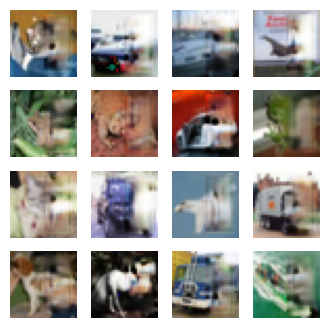

391/391 [==============================] - 30s 78ms/step - d_loss: 0.6753 - adv_g_loss: 0.1790 - gen_g_loss: 0.0142
Epoch 39/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6829 - adv_g_loss: 0.1748 - gen_g_loss: 0.0136

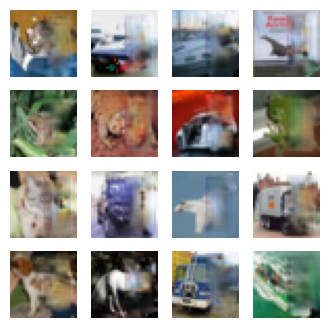

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6826 - adv_g_loss: 0.1748 - gen_g_loss: 0.0136
Epoch 40/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6918 - adv_g_loss: 0.1706 - gen_g_loss: 0.0147

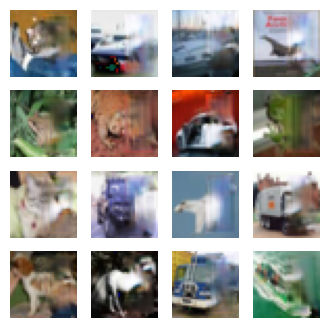

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6917 - adv_g_loss: 0.1706 - gen_g_loss: 0.0146
Epoch 41/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6635 - adv_g_loss: 0.1836 - gen_g_loss: 0.0145

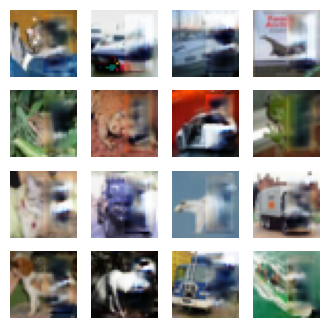

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6636 - adv_g_loss: 0.1836 - gen_g_loss: 0.0145
Epoch 42/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6563 - adv_g_loss: 0.1845 - gen_g_loss: 0.0144

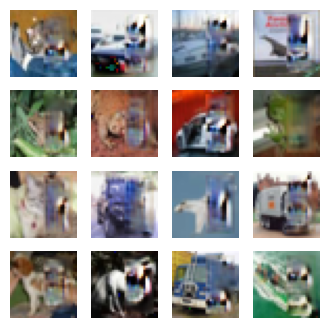

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6567 - adv_g_loss: 0.1845 - gen_g_loss: 0.0144
Epoch 43/50
391/391 [==============================] - ETA: 0s - d_loss: 0.6676 - adv_g_loss: 0.1765 - gen_g_loss: 0.0145

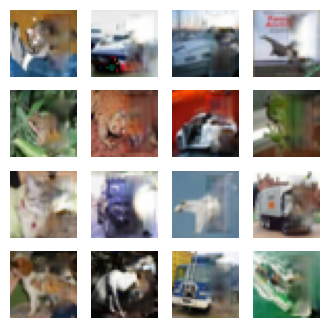

391/391 [==============================] - 30s 77ms/step - d_loss: 0.6677 - adv_g_loss: 0.1764 - gen_g_loss: 0.0145
Epoch 44/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6695 - adv_g_loss: 0.1811 - gen_g_loss: 0.0150

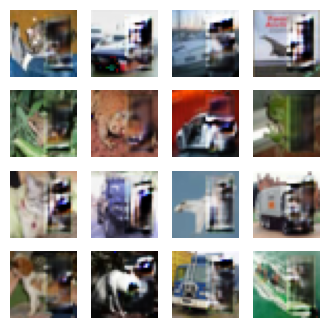

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6689 - adv_g_loss: 0.1814 - gen_g_loss: 0.0150
Epoch 45/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6437 - adv_g_loss: 0.1947 - gen_g_loss: 0.0146

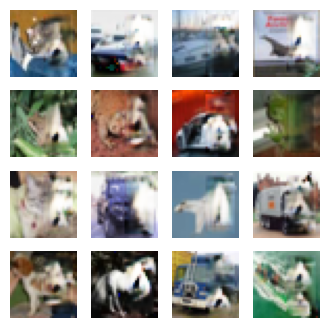

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6435 - adv_g_loss: 0.1948 - gen_g_loss: 0.0146
Epoch 46/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6730 - adv_g_loss: 0.1845 - gen_g_loss: 0.0145

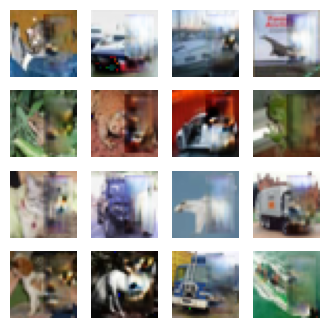

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6731 - adv_g_loss: 0.1844 - gen_g_loss: 0.0145
Epoch 47/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6649 - adv_g_loss: 0.1798 - gen_g_loss: 0.0147

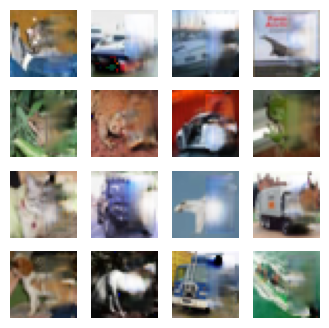

391/391 [==============================] - 30s 77ms/step - d_loss: 0.6648 - adv_g_loss: 0.1797 - gen_g_loss: 0.0147
Epoch 48/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6691 - adv_g_loss: 0.1832 - gen_g_loss: 0.0148

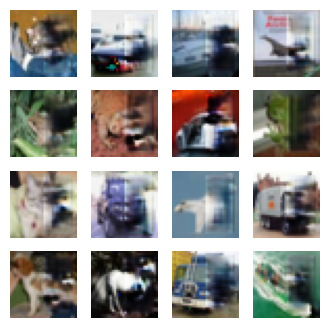

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6687 - adv_g_loss: 0.1833 - gen_g_loss: 0.0148
Epoch 49/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6631 - adv_g_loss: 0.1830 - gen_g_loss: 0.0145

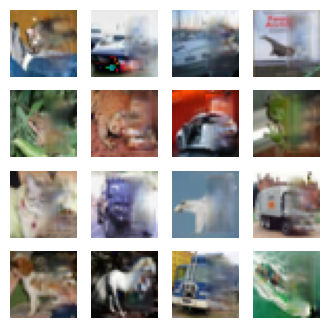

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6634 - adv_g_loss: 0.1828 - gen_g_loss: 0.0144
Epoch 50/50
390/391 [============================>.] - ETA: 0s - d_loss: 0.6597 - adv_g_loss: 0.1825 - gen_g_loss: 0.0140

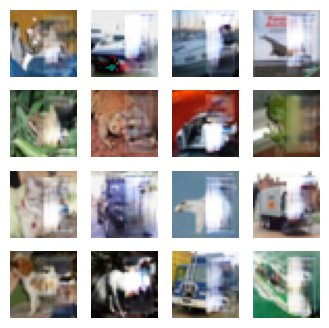

391/391 [==============================] - 30s 76ms/step - d_loss: 0.6596 - adv_g_loss: 0.1828 - gen_g_loss: 0.0140


In [56]:
gan.fit(masked_x_train, x_train, epochs=EPOCHS,batch_size=BATCH_SIZE, callbacks=[gifCallback()])

In [57]:
gan.save_weights('gan_inpainting.h5')
gan.generator.save_weights("unet_gan_inpainting.h5")

In [62]:
predictions=gan.generator.predict(x=masked_x_test, verbose=0)

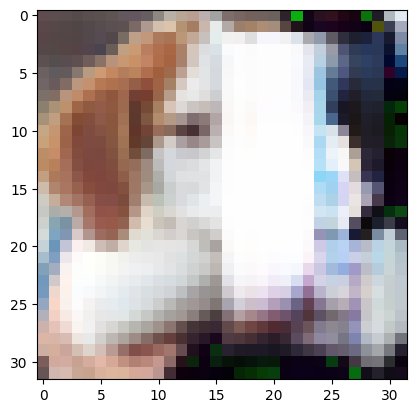

In [63]:
plt.imshow(predictions[16])

# Training refiner
I'm training a second unet with mse that takes in input the generated images, to refine and get closer to the actual image

In [ ]:
ae_refiner=make_generator_model((32,32,3),L=2, conv_per_L=2,lam=False)
ae_refiner.compile(loss="mean_squared_error", optimizer=optimizers.AdamW(learning_rate=0.0002, beta_1=0.5))
ae_refiner.summary()

In [ ]:
ae_refiner.fit(x=predictions, y=x_train,epochs=30, batch_size=256,validation_split=0.1)

# Testing

In [ ]:
predictions2=gan.generator.predict(x=masked_x_test, verbose=0)
refined=ae_refiner.predict(x=predictions2, verbose=0)
#super impose the final predictions on the masked images
patch_coords=np.where(masked_x_test[0]==0)
final_pred=x_test
final_pred[:,patch_coords[0],patch_coords[0],:]=refined[:,patch_coords[0],patch_coords[0],:]

In [ ]:
def test(index):
  plt.figure(figsize=(10,5))

  plt.subplot(1,4,1)
  plt.title("masked")
  plt.imshow(masked_x_test[index])

  plt.subplot(1,4,2)
  plt.title("original")
  plt.imshow(x_test[index])

  plt.subplot(1,4,3)
  plt.title("gan predictions")
  plt.imshow(predictions2[index])

  plt.subplot(1,4,4)
  plt.title("unet predictions")
  plt.imshow(final_pred[index])
for i in np.random.randint(0, x_test.shape[0], size=10):
  test(i)

In [66]:
from keras import backend as K
mse = K.mean(K.square(x_test - predictions))
print("mean squared error:", K.eval(mse))


mean squared error: 0.023146464


In [64]:
anim_file = 'dcgan.gif'
import imageio
import glob
with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

<ipython-input-64-a6f0caf45473>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
<ipython-input-64-a6f0caf45473>:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



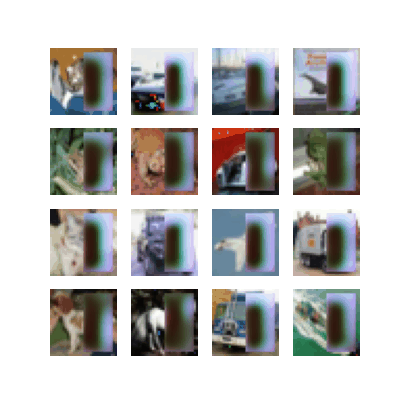

In [65]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)